In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
from PIL import Image
import cv2
from sklearn.cluster import KMeans
import random
import tensorflow as tf

from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Conv2D, Conv2DTranspose,MaxPooling2D, Dense, Dropout, LeakyReLU, UpSampling2D,Concatenate,Activation, ZeroPadding2D,Add,AveragePooling2D,Multiply
from keras.optimizers import Adam, SGD
from keras.callbacks import ModelCheckpoint
from keras.initializers import glorot_uniform

In [7]:
#Loading the image and applying the data augmentations such as rotating,flipping 
def LoadImage(name, path="/content/drive/MyDrive/cityscapes_data/train",rotation=0.0, flip=False, cut_bottom=58,size=(256, 256)):
    img = Image.open(path+"/"+name)
    img = np.array(img)
    seg = img[:-cut_bottom, 256:]
    img = img[:-cut_bottom, 0:256]
    
    for i in range(3):
        zimg = img[:,:,i]
        zimg = cv2.equalizeHist(zimg)
        img[:,:,i] = zimg
    
    img = Image.fromarray(img).resize(size)
    seg = Image.fromarray(seg).resize(size)
    
    

    img = img.rotate(rotation)
    seg = seg.rotate(rotation)

    img = np.array(img)
    seg = np.array(seg)

    if flip:
        img = img[:,::-1,:]
        seg = seg[:,::-1,:]
    return img/255, seg/255

In [8]:
files =os.listdir("/content/drive/MyDrive/cityscapes_data/train")[0:10]


'''
Due to the compression of the JPEG standard, there are more than only a few discrete colors in the segmented image. To 
find the most imortant colors and identify similar colors we can use KMeans clustering. This also allows us to go from a 
color representation to a class representation.
'''


colors = []
for file in files:
    img, seg = LoadImage(file)
    colors.append(seg.reshape(seg.shape[0]*seg.shape[1], 3))
colors = np.array(colors)
colors = colors.reshape((colors.shape[0]*colors.shape[1],3))

km = KMeans(13)
km.fit(colors)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=13, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [9]:
'''
After clustering the image contains information about 13 different layers. Computer displays can only utilize the RGB 
colorspace. This function converts the layer representation to a color representation. This is just for visualizing.
'''

def LayersToRGBImage(img):
    colors = [(255,0,0), (0,255,0), (0,0,255),(255,255,0), (255,0,255), (0,255,255),(255,255,255), (200,50,0),(50,200,0),(50,0,200), 
              (200,200,50), (0,50,200),(0,200,50), (0,0,0)]
    
    nimg = np.zeros((img.shape[0], img.shape[1], 3))
    for i in range(img.shape[2]):
        c = img[:,:,i]
        col = colors[i]
        
        for j in range(3):
            nimg[:,:,j]+=col[j]*c
    nimg = nimg/255.0
    return nimg

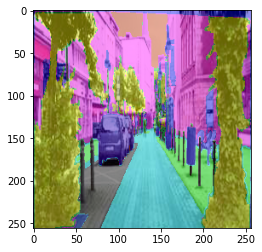

In [10]:
'''
This function converts the discrete color representation (output of the color clustering) to a 13-dimensional class 
representation.
'''

def ColorsToClass(seg):
    s = seg.reshape((seg.shape[0]*seg.shape[1],3))
    s = km.predict(s)
    s = s.reshape((seg.shape[0], seg.shape[1]))
    
    n = len(km.cluster_centers_)
    
    cls = np.zeros((seg.shape[0], seg.shape[1], n))
    
    for i in range(n):
        m = np.copy(s)
        m[m!=i] = 0
        m[m!=0] = 1
        
        cls[:,:,i]=m
        
    return cls

img, seg = LoadImage("234.jpg")
seg2 = ColorsToClass(seg)
seg2 = LayersToRGBImage(seg2)
total = cv2.addWeighted(img, 0.6, seg2, 0.4, 0)
plt.imshow(total[:,:,:])
plt.show()

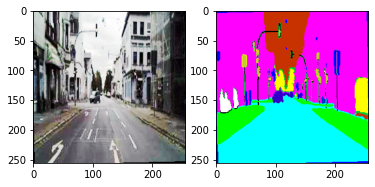

In [11]:
'''
To make training more memory efficient a generator is used for feeding the data to the deep learning algorithm. This 
generator creates batches of e.g. 10 raw-segmented image pairs at a time. It also uses image augmentation and randomly 
flips and rotates the images to increase the effective size of the dataset.
'''


def Generate(path="/content/drive/MyDrive/cityscapes_data/train", batch_size=10,maxangle=10.0):
    
    files = os.listdir(path)
    while True:
        imgs=[]
        segs=[]
        
        for i in range(batch_size):
            file = random.sample(files,1)[0]
            
            flip=False
            if random.random() > 0.5:
                flip=True
            
            angle = maxangle*(random.random()*2-1)
            
            img, seg = LoadImage(file, path, rotation=angle, flip=flip)
            
            seg = ColorsToClass(seg)
            
            imgs.append(img)
            segs.append(seg)
        yield np.array(imgs), np.array(segs)
gen = Generate()
imgs, segs = next(gen)

plt.subplot(121)
plt.imshow(imgs[0])
plt.subplot(122)
plt.imshow(LayersToRGBImage(segs[0]))
plt.show()

# CANE Architecture

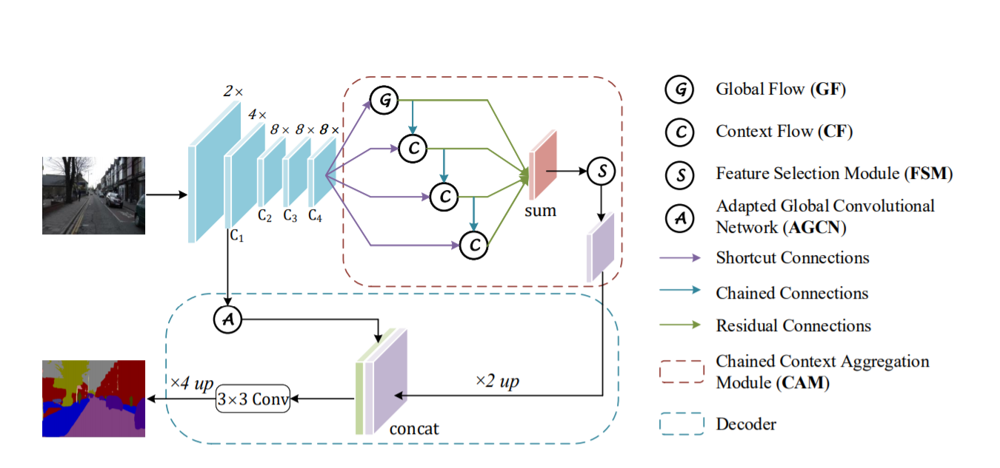

In [1]:
from IPython.display import Image
Image(filename='CANE architecture.png',width=700)

#### a.Conv Block and Identity block

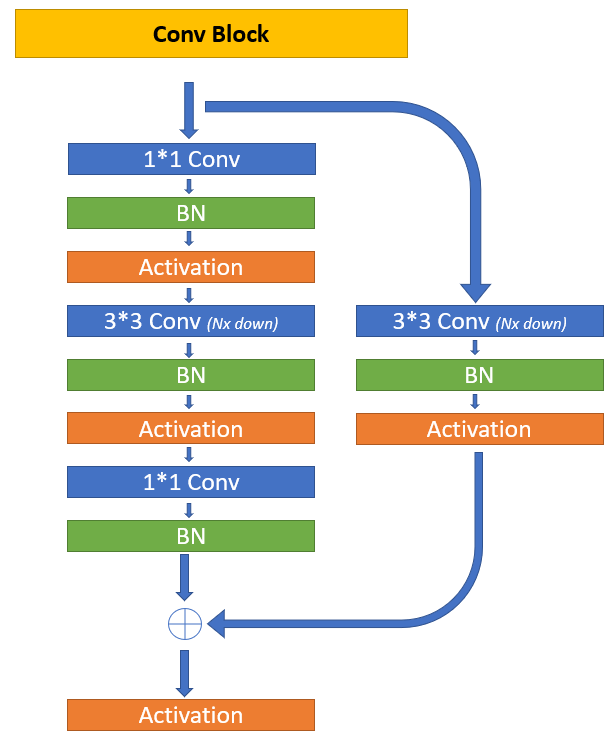

In [4]:
from IPython.display import Image
Image(filename='CONV and IDENTITY block.png',width=400)

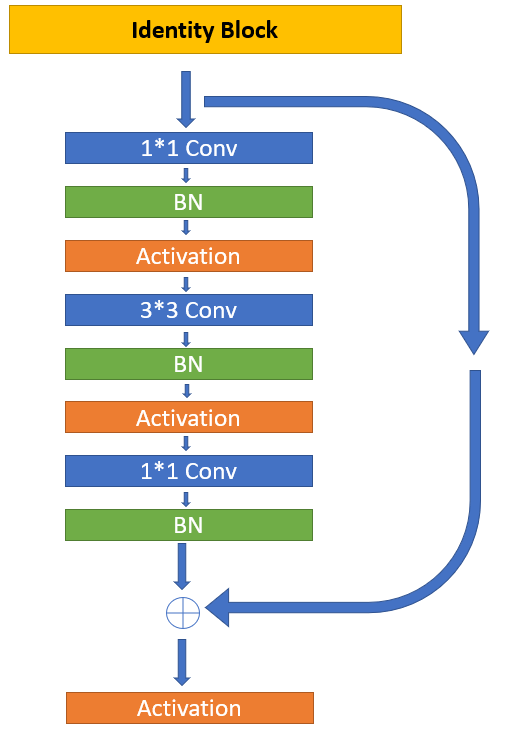

In [5]:
from IPython.display import Image
Image(filename='Identity block.png',width=400)

#### b.CAM module(Global flow,Context flow,Feature Selection Module)

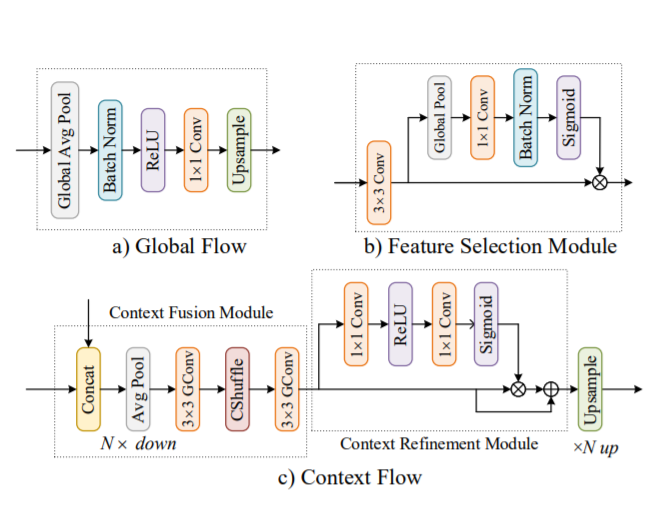

In [8]:
from IPython.display import Image
Image(filename='CAM module.png',width=600)

#### c.Adapted Global Convolutional Network

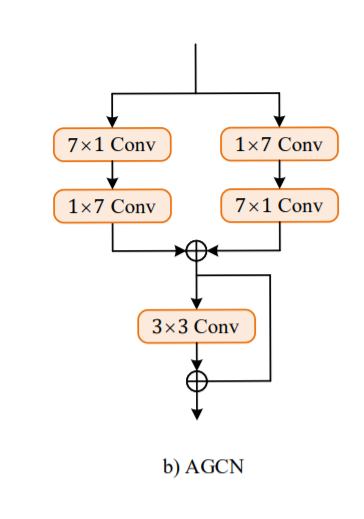

In [9]:
from IPython.display import Image
Image(filename='AGCN.png',width=300)

In [12]:
def convolutional_block(X, f, filters, stage, block, s = 1):
    
    # defining name basis
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    
    # Retrieve Filters
    F1, F2, F3 = filters
    
    X_shortcut = X

    X = Conv2D(F1, (1, 1), strides = (s,s), name = conv_name_base + '2a', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2a')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters = F2, kernel_size = (f, f), strides = (1,1), padding = 'same', name = conv_name_base + '2b', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2b')(X)
    X = Activation('relu')(X)


    X = Conv2D(filters = F3, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2c', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2c')(X)

    X_shortcut = Conv2D(filters = F3, kernel_size = (1, 1), strides = (s,s), padding = 'valid', name = conv_name_base + '1',
                        kernel_initializer = glorot_uniform(seed=0))(X_shortcut)
    X_shortcut = BatchNormalization(axis = 3, name = bn_name_base + '1')(X_shortcut)

    X = Add()([X, X_shortcut])
    X = Activation('relu')(X)
    
    
    return X

In [13]:
def identity_block(X, f, filters, stage, block):
    
    # defining name basis
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    
    # Retrieve Filters
    F1, F2, F3 = filters
     
    X_shortcut = X
    
    X = Conv2D(filters = F1, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2a', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2a')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters = F2, kernel_size = (f, f), strides = (1,1), padding = 'same', name = conv_name_base + '2b', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2b')(X)
    X = Activation('relu')(X)

    X = Conv2D(filters = F3, kernel_size = (1, 1), strides = (1,1), padding = 'valid', name = conv_name_base + '2c', kernel_initializer = glorot_uniform(seed=0))(X)
    X = BatchNormalization(axis = 3, name = bn_name_base + '2c')(X)

    X = Add()([X, X_shortcut])
    X = Activation('relu')(X)
    
    
    return X

In [48]:
X_input = Input(shape=(256, 256, 3))

#Stage 1
X = Conv2D(64, (3, 3), name='conv1', kernel_initializer=glorot_uniform(seed=0))(X_input)
X = BatchNormalization(axis=3, name='bn_conv1')(X)
X = Activation('relu')(X)
X = MaxPooling2D((3, 3), strides=(2, 2))(X)

#Stage 2
X_ag_cat = convolutional_block(X, f=3, filters=[4, 4, 8], stage=2, block='a', s=4)
X = identity_block(X_ag_cat, 3, [4, 4, 8], stage=2, block='b')
X = identity_block(X, 3, [4, 4, 8], stage=2, block='c')

#Stage 3
X = convolutional_block(X, f = 3, filters = [8, 8, 16], stage = 3, block='a', s = 1)
X = identity_block(X, 3, [8, 8, 16], stage=3, block='b')
X = identity_block(X, 3, [8, 8, 16], stage=3, block='c')
X = identity_block(X, 3, [8, 8, 16], stage=3, block='d')

#Stage 4
X = convolutional_block(X, f = 3, filters = [16, 16, 32], stage = 4, block='a', s = 1)
X = identity_block(X, 3, [16, 16, 32], stage=4, block='b')
X = identity_block(X, 3, [16, 16, 32], stage=4, block='c')
X = identity_block(X, 3, [16, 16, 32], stage=4, block='d')
X = identity_block(X, 3, [16, 16, 32], stage=4, block='e')
X = identity_block(X, 3, [16, 16, 32], stage=4, block='f')

# Stage5
X = convolutional_block(X, f = 3, filters = [32, 32, 64], stage = 5, block='a', s = 1)
X = identity_block(X, 3, [32, 32, 64], stage=5, block='b')
X = identity_block(X, 3, [32, 32, 64], stage=5, block='c')

#Global Flow operation
x_GF = AveragePooling2D(1,(16,16))(X)                    
x_GF2 = BatchNormalization()(x_GF)                             
x_GF3 = Activation('relu')(x_GF2)    
GF_Conv_1 = Conv2D(32, (1, 1), activation = 'relu', padding = 'same', name = 'GF_conv1' )(x_GF3)
GF_Conv_T=(UpSampling2D((16,16), interpolation='bilinear'))(GF_Conv_1)

#Context Flow operation1
c1 = Concatenate()([X,GF_Conv_T])
CF_x1 = AveragePooling2D((2, 2),  (2, 2), name = 'CF1_pool' )(c1)
CF_Conv_11 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same', name = 'CF1_conv1' )(CF_x1)
CF_Conv_12 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same', name = 'CF1_conv2')(CF_Conv_11)
CF_Conv_13 = Conv2D(32, (1, 1), activation = 'relu', padding = 'same', name = 'CF1_conv3' )(CF_Conv_12)
CF_x2 = Activation('relu')(CF_Conv_13)
CF_Conv_14 = Conv2D(32, (1, 1), activation = 'relu', padding = 'same', name = 'CF1-conv4' )(CF_x2)
CF_x3 = Activation('sigmoid')(CF_Conv_14)
CF_x4 = Multiply()([CF_Conv_12 , CF_Conv_14])
CF_x5 = Add()([CF_Conv_12,CF_x4])
CF_Conv_T1=(UpSampling2D((2,2), interpolation='bilinear'))(CF_x5)

#Context Flow operation2
c12= Concatenate()([X,CF_Conv_T1])
x = AveragePooling2D((2, 2), (2, 2), name = 'CF2_pool' )(c12)
CF_Conv_21 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same', name = 'CF2_conv1' )(x)
CF_Conv_22 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same', name = 'CF2_conv2' )(CF_Conv_11)
CF_Conv_23 = Conv2D(32, (1, 1), activation = 'relu', padding = 'same', name = 'CF2_conv3')(CF_Conv_12)
x = Activation('relu')(CF_Conv_13)
CF_Conv_24 = Conv2D(32, (1, 1), activation = 'relu', padding = 'same', name = 'CF2_conv4' )(x)
x =  Activation('sigmoid')(CF_Conv_24)
x = Multiply()([CF_Conv_22 , CF_Conv_24])
x = Add()([CF_Conv_22,x])
CF_Conv_T2=(UpSampling2D((2,2), interpolation='bilinear'))(x)

#Context Flow operation3
c3 = Concatenate()([X,CF_Conv_T2])
x = AveragePooling2D((2, 2),  (2, 2), name = 'CF3_pool')(c1)
CF_Conv_31 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same', name = 'CF3_conv1')(x)
CF_Conv_32 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same', name = 'CF3_conv2')(CF_Conv_11)
CF_Conv_33 = Conv2D(32, (1, 1), activation = 'relu', padding = 'same', name = 'CF3_conv3' )(CF_Conv_12)
x = Activation('relu')(CF_Conv_13)
CF_Conv_34 = Conv2D(32, (1, 1), activation = 'relu', padding = 'same', name = 'CF3_conv4' )(x)
x = Activation('sigmoid')(CF_Conv_34)
x =  Multiply()([CF_Conv_32 , CF_Conv_34])
x = Add()([CF_Conv_32,x])
CF_Conv_T3=(UpSampling2D((2,2), interpolation='bilinear'))(x)


#Sum operation 
o = Add(name = 'add')([GF_Conv_T, CF_Conv_T1, CF_Conv_T2, CF_Conv_T3])


#FSM implementation architecture
FS_Conv_1 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same', name = 'FS_conv1')(o)
x = AveragePooling2D(1,(2, 2), name = 'FS_pool')(FS_Conv_1)
FS_Conv_2 = Conv2D(32, (1, 1), activation = 'relu', padding = 'same', name = 'FS_conv2')(x)
bn = BatchNormalization()(FS_Conv_2)
s = Activation('sigmoid')(bn)
#To get output shape is equal to input shape so that's why we are doing upsampling here
CF_Conv_T3=(UpSampling2D((2,2), interpolation='bilinear'))(x)
x = Multiply()([FS_Conv_1,CF_Conv_T3])

mid_Conv = Conv2D(32, (3, 3), activation = 'relu', padding = 'same', name = 'FS_Conv3')(x)


#AGCN implementation architecture
AG_Conv_L1 = Conv2D(32, (7, 1), activation = 'relu', padding = 'same', name = 'AG_conv1' )(X_ag_cat)
AG_Conv_L2 = Conv2D(32, (1, 7), activation = 'relu', padding = 'same', name = 'AG_conv2')(AG_Conv_L1)

AG_Conv_R1 = Conv2D(32, (1, 7), activation = 'relu', padding = 'same', name = 'AG_conv3' )(X_ag_cat)
AG_Conv_R2 = Conv2D(32, (7, 1), activation = 'relu', padding = 'same', name = 'AG_conv4')(AG_Conv_R1)

o2 = Add()([AG_Conv_L2,AG_Conv_R2])

AG_Conv_F1 = Conv2D(32, (3, 3), activation = 'relu', padding = 'same', name = 'AG_conv5' )(o2)

o3 = Add()([o2,AG_Conv_F1])

Conc_A =  (UpSampling2D((2,2), interpolation='bilinear'))(mid_Conv)
Conc_B = (UpSampling2D((2,2), interpolation='bilinear'))(o3)
CF = Concatenate()([Conc_A,Conc_B])
Final = Conv2D(13, (3, 3), activation = 'relu', padding = 'same', name = 'FinalBlock1')(CF)
    
o_Final  = UpSampling2D((4,4), interpolation = 'bilinear')(Final)
Final = (Activation('softmax'))(o_Final)
model = Model(inputs = X_input, outputs = Final, name='ResNet50')

model.summary()

(None, 16, 16, 32)
(None, 16, 16, 32)
Model: "ResNet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_35 (InputLayer)           [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 254, 254, 64) 1792        input_35[0][0]                   
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 254, 254, 64) 256         conv1[0][0]                      
__________________________________________________________________________________________________
activation_1795 (Activation)    (None, 254, 254, 64) 0           bn_conv1[0][0]                   
_____________________________________________________

In [49]:
tf.keras.utils.plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True,rankdir='TB')

In [50]:
train_gen = Generate()
val_gen = Generate("/content/drive/MyDrive/cityscapes_data/val")

In [51]:
opt = Adam(lr=0.0001)
model.compile(optimizer=opt,loss="categorical_crossentropy",metrics=["accuracy"])

In [52]:
callbacks = [ModelCheckpoint("loss.h5", save_best_only=True, verbose=0)]
history = model.fit_generator(train_gen, epochs=300, steps_per_epoch=10,validation_data=val_gen, validation_steps=10,callbacks=callbacks,verbose=1)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/300
10/10 [==============================] - 142s 12s/step - loss: 2.9369 - accuracy: 0.1899 - val_loss: 2.4937 - val_accuracy: 0.0318
Epoch 2/300
10/10 [==============================] - 97s 11s/step - loss: 2.3665 - accuracy: 0.2488 - val_loss: 2.4945 - val_accuracy: 0.1950
Epoch 3/300
10/10 [==============================] - 80s 9s/step - loss: 2.0793 - accuracy: 0.3317 - val_loss: 2.4254 - val_accuracy: 0.2423
Epoch 4/300
10/10 [==============================] - 76s 8s/step - loss: 2.0084 - accuracy: 0.3519 - val_loss: 2.3874 - val_accuracy: 0.2425
Epoch 5/300
10/10 [==============================] - 70s 8s/step - loss: 1.9413 - accuracy: 0.3817 - val_loss: 2.3492 - val_accuracy: 0.2410
Epoch 6/300
10/10 [==============================] - 63s 7s/step - loss: 1.8596 - accuracy: 0.4084 - val_loss: 2.2946 - val_accuracy: 0.2387
Epoch 7/300
10/10 [==============================] - 59s 7s/step - loss: 1.7991 - accuracy: 0.4192 - val_loss: 2.2664 - val_accuracy: 0.2509
Epoch 8/30

In [53]:
history = model.fit_generator(train_gen, epochs=100, steps_per_epoch=10,validation_data=val_gen, validation_steps=10,callbacks=callbacks,verbose=1)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/100
10/10 [==============================] - 8s 854ms/step - loss: 0.9824 - accuracy: 0.6685 - val_loss: 1.0802 - val_accuracy: 0.6352
Epoch 2/100
10/10 [==============================] - 8s 854ms/step - loss: 1.0228 - accuracy: 0.6518 - val_loss: 1.1229 - val_accuracy: 0.6235
Epoch 3/100
10/10 [==============================] - 8s 838ms/step - loss: 1.0326 - accuracy: 0.6440 - val_loss: 1.0780 - val_accuracy: 0.6336
Epoch 4/100
10/10 [==============================] - 8s 846ms/step - loss: 1.0115 - accuracy: 0.6600 - val_loss: 1.1032 - val_accuracy: 0.6389
Epoch 5/100
10/10 [==============================] - 8s 865ms/step - loss: 1.0671 - accuracy: 0.6426 - val_loss: 1.1194 - val_accuracy: 0.6215
Epoch 6/100
10/10 [==============================] - 8s 875ms/step - loss: 1.1032 - accuracy: 0.6359 - val_loss: 1.1720 - val_accuracy: 0.6123
Epoch 7/100
10/10 [==============================] - 8s 853ms/step - loss: 1.0273 - accuracy: 0.6615 - val_loss: 1.1046 - val_accuracy: 0.6308

In [54]:
model.save("model1.h5")
model = load_model("loss.h5")

In [55]:
loss=history.history["loss"]
acc=history.history["accuracy"]
val_loss = history.history["val_loss"]
val_acc = history.history["val_accuracy"]

Text(0, 0.5, 'Accuracy')

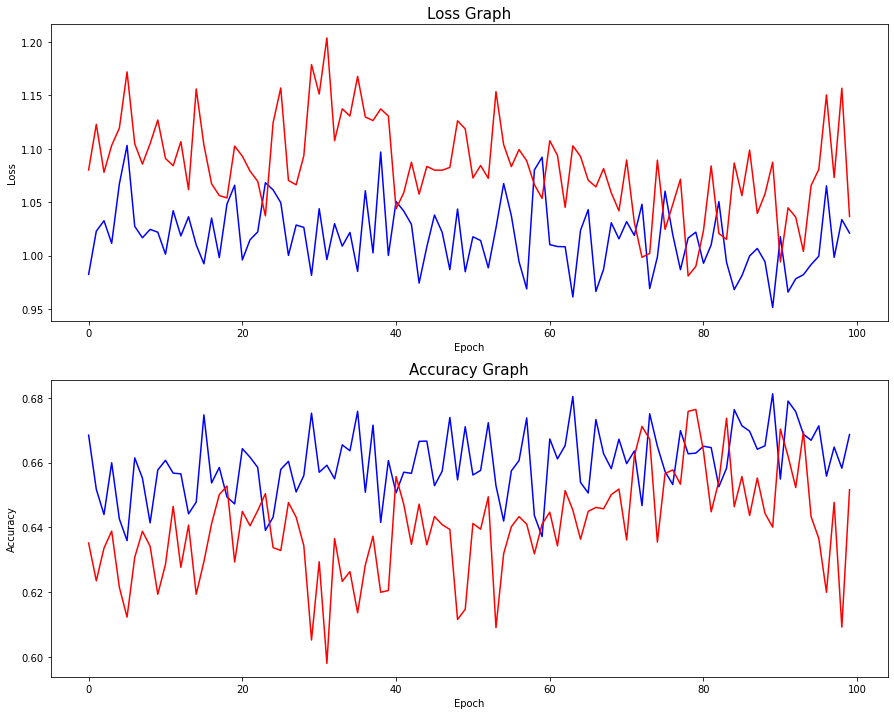

In [59]:
plt.figure(figsize=(15, 12))
plt.subplot(211)
plt.title("Loss Graph",fontsize = 15)
plt.plot(loss, 'b-')
plt.plot(val_loss,'r-')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.subplot(212)
plt.title("Accuracy Graph",fontsize = 15)
plt.plot(acc, 'b-')
plt.plot(val_acc,'r-')
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

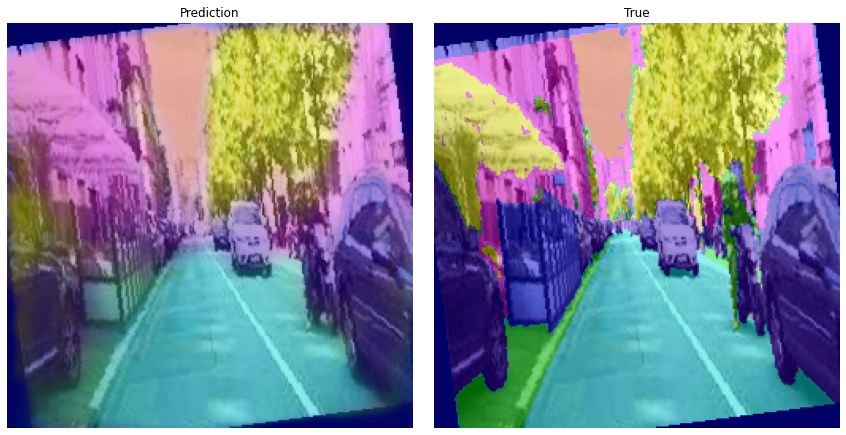

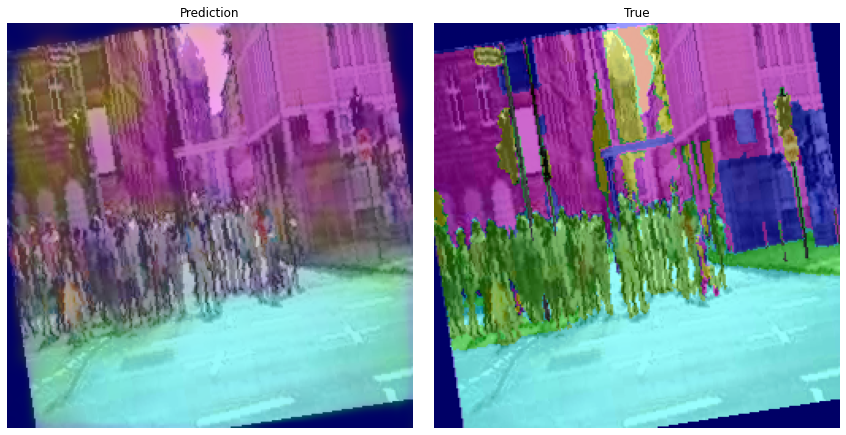

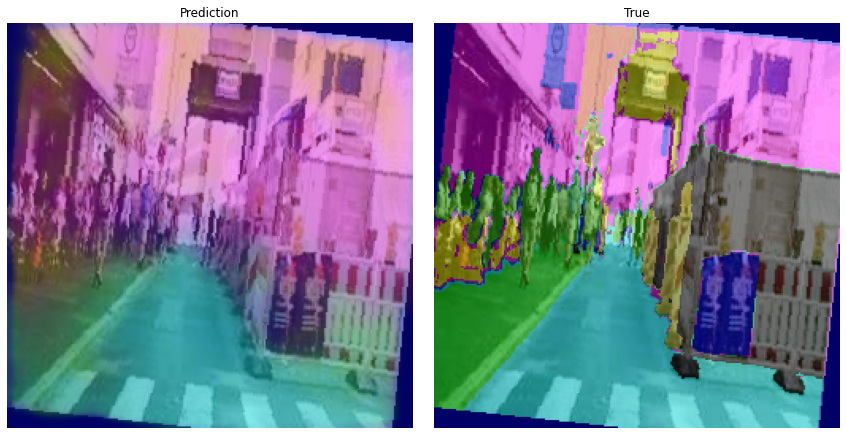

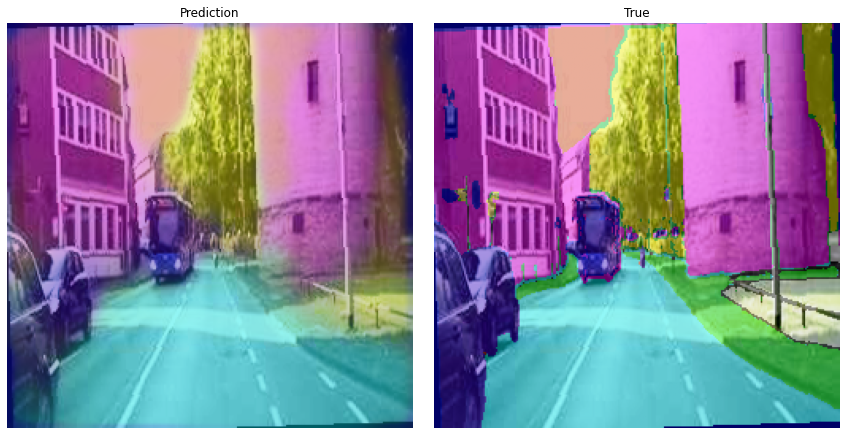

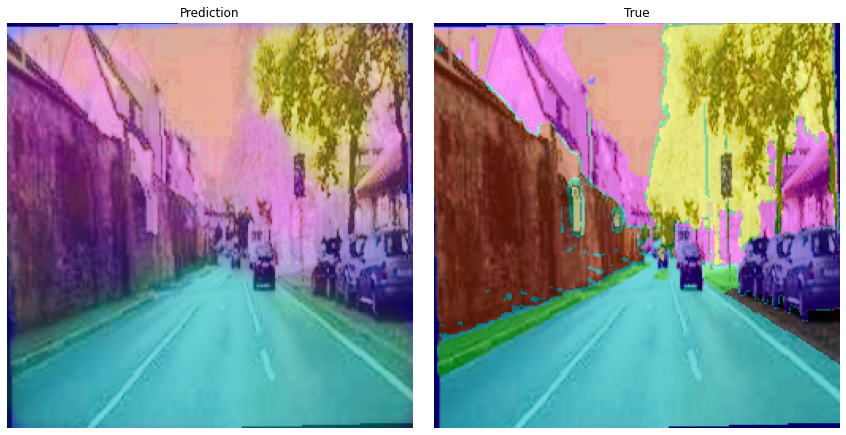

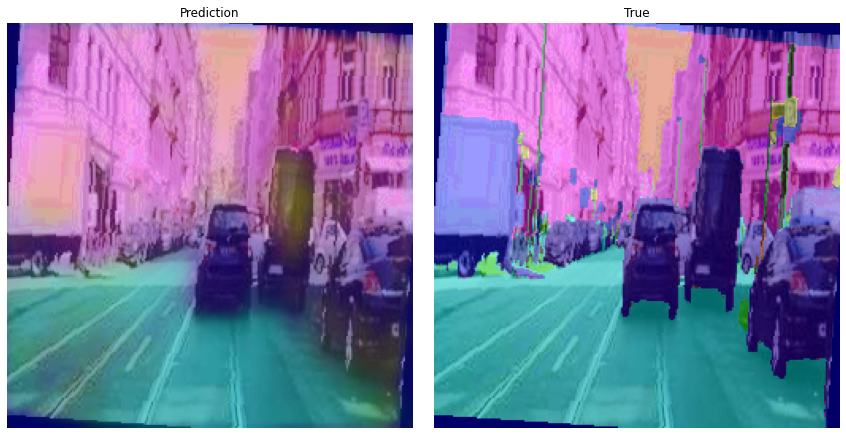

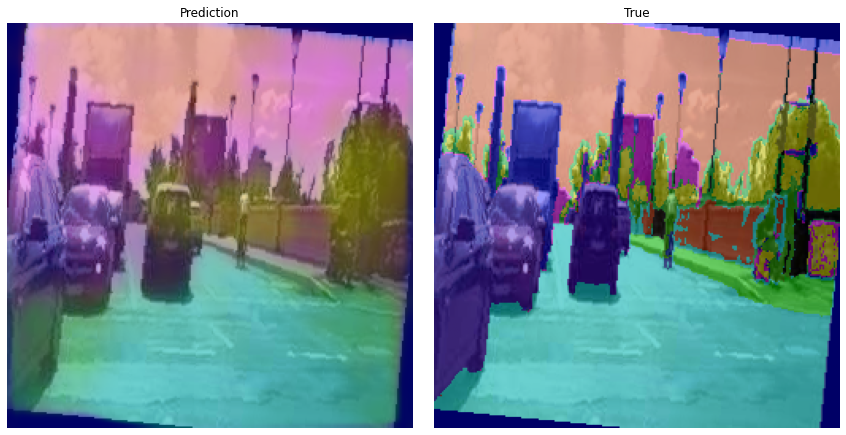

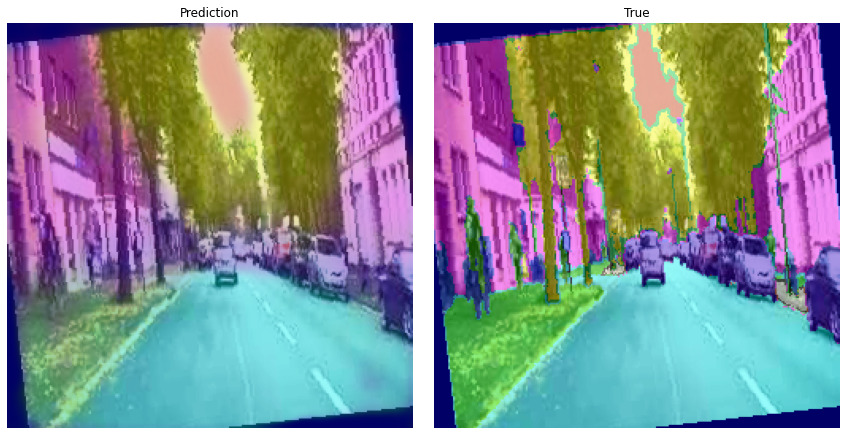

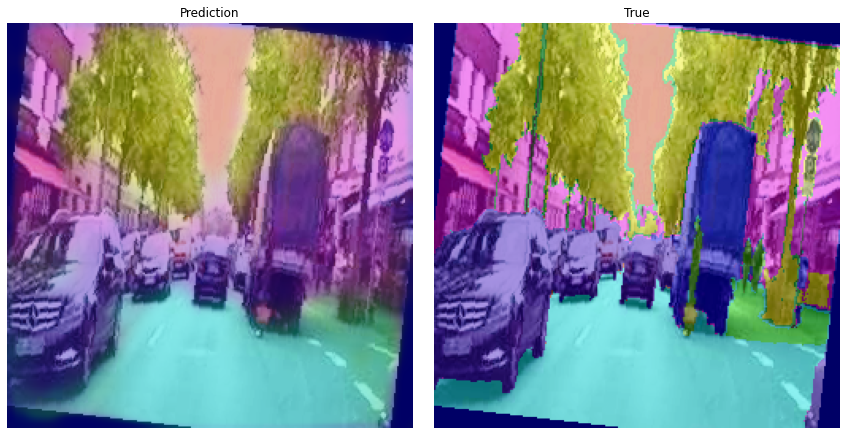

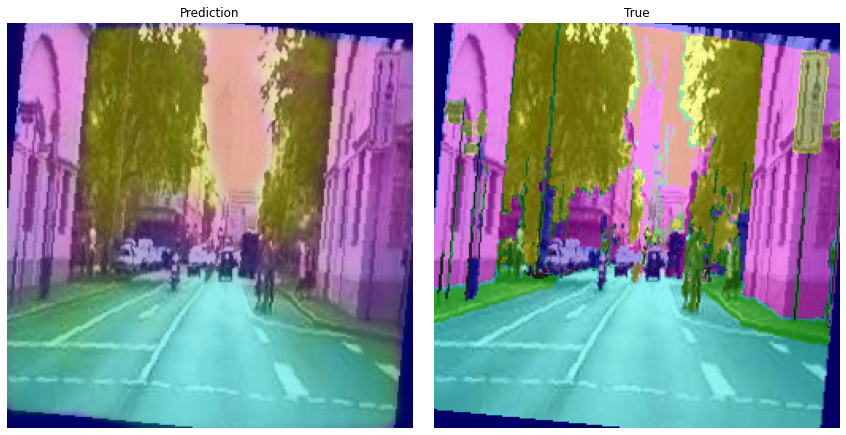

In [57]:
test_gen = Generate("/content/drive/MyDrive/cityscapes_data/val")
max_show=20
for imgs, segs in test_gen:
    p = model.predict(imgs)
    for i in range(p.shape[0]):
        if i > max_show:
            break
        _p = LayersToRGBImage(p[i])
        _s = LayersToRGBImage(segs[i])
        
        predicted_img = cv2.addWeighted(imgs[i], 0.6, _p, 0.4, 0)
        true_img = cv2.addWeighted(imgs[i], 0.6, _s, 0.4, 0)
        plt.figure(figsize=(12,6))
        plt.subplot(121)
        plt.title("Prediction")
        plt.imshow(predicted_img)
        plt.axis("off")
        plt.subplot(122)
        plt.title("True")
        plt.imshow(true_img)
        plt.axis("off")
        plt.tight_layout()
        plt.savefig("pred_"+str(i)+".png", dpi=150)
        plt.show()
    break